In [35]:
import pandas as pd
import folium
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [2]:
# Read the Excel files
df1 = pd.read_csv("运输路线管理8103.csv")
df2 = pd.read_csv("new_onlyXiamen_addcode.csv")
df3 = pd.read_excel("配送地址库信息.xlsx", engine='openpyxl')
df5 = pd.read_excel("empty经纬度new.xlsx", engine='openpyxl')

/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/openpyxl/styles/stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [4]:
# Group by 'ROUTEID' and count occurrences
filtered_df = df1
filtered_df = filtered_df[["ROUTEID", "TRANSID", "INCEPTADDR", "SENDPOS"]]
filtered_df
filtered_df.to_csv('XiaMen_locations.csv', index=False)

In [5]:
df4 = pd.read_csv("XiaMen_locations.csv")
df3 = df3[~df3['地址编码'].str.startswith("P")]
df3['地址编码'] = df3['地址编码'].astype(str)
df4

,ROUTEID,TRANSID,INCEPTADDR,SENDPOS
0,3,358,厦门市思明区仙岳路555号109-110店面,厦门思明仁爱门诊部
1,3,366,思明区湖滨北路259号501室,厦门思明晓民医疗美容诊所
2,3,367,厦门市思明区厦禾路1106号之一,厦门思明新鹭厦门诊部有限公司
3,3,368,思明区湖滨北路育秀里36号三楼304单元,厦门思明修志夫整形外科门诊部
4,3,371,厦门市思明区禾祥东路18-13号,厦门思明艺贞禾祥诊所
...,...,...,...,...
35953,21,2236380,厦门市湖里区高林西里7号102单元,高林西里
35954,21,2236511,厦门市海沧区沧林路666号,沧林路店
35955,21,2236510,厦门市集美区灌南工业区安仁大道1599号,镇海路新特药店
35956,21,2237474,厦门市同安区祥平西路223、225、227号,同安分店


In [6]:
print('df5 columns:', df5.columns)
print('df3 columns:', df3.columns)


df5 columns: Index(['地址', '收货客户', '地址名称', '经度', '纬度'], dtype='object')
df3 columns: Index(['地址', '收货客户', '地址编码', '地址名称', '地址类别', '地址库类型', '客户编码', '实际承运商', '联系人名',
       '经度', '纬度', '联系电话', '业务区域', '备注'],
      dtype='object')


In [7]:
merged_df = pd.merge(df3, df5[['地址', '收货客户', '地址名称', '经度', '纬度']], 
                     on=['地址', '收货客户', '地址名称'], 
                     how='left', 
                     suffixes=('', '_from_df5'))

# Fill missing values in '经度' and '纬度' columns of merged_df 
# using corresponding values from df5
merged_df['经度'] = merged_df['经度'].fillna(merged_df['经度_from_df5'])
merged_df['纬度'] = merged_df['纬度'].fillna(merged_df['纬度_from_df5'])

# Drop the columns '经度_from_df5' and '纬度_from_df5' 
# since we've already filled the missing values
merged_df.drop(columns=['经度_from_df5', '纬度_from_df5'], inplace=True)
merged_df['location'] = merged_df['经度'].astype(str) + "," + merged_df['纬度'].astype(str)
merged_df
# merged_df.to_csv('XiaMen_地点经纬度.csv', index=False)

,地址,收货客户,地址编码,地址名称,地址类别,地址库类型,客户编码,实际承运商,联系人名,经度,纬度,联系电话,业务区域,备注,location
0,厦门市海沧区新阳街道市第一农场孚莲一里313号,厦门市百兴德药业有限公司,3404262,(3404262)厦门市海沧区新阳街道市第一农场孚莲一里313号,配送地,收货方,3404262,鹭燕医药股份有限公司,咸平平,117.962617,24.530733,18695939746,厦门物流中心,NaN,"117.962617,24.530733"
1,武汉市蔡甸区奓山街土山村汽车线束1号厂房第2、3层,湖北聚祥珐医药有限公司,2766468,(2766468)湖北聚祥珐医药有限公司,配送地,收货方,2766468,NaN,湖北聚祥珐医药有限公司,114.057168,30.447924,19522982090,厦门物流中心,NaN,"114.057168,30.447924"
2,厦门市同安区大同街道田洋村朝洋路1155号2#,厦门市田洋托养院医务室,2246657,(2246657)厦门市田洋托养院医务室,配送地,收货方,2246657,NaN,厦门市田洋托养院医务室,118.134879,24.750098,13400681595,厦门物流中心,NaN,"118.134879,24.750098"
3,厦门市翔安区新店镇顶曾路78号,厦门永廷堂药业有限公司,2246658,(2246658)厦门永廷堂药业有限公司,配送地,收货方,2246658,NaN,彭亚丽,118.240543,24.625919,13656037067,厦门物流中心,NaN,"118.240543,24.625919"
4,东营区淄博路5号,东营区蓬清中医门诊部,2470347,(2470347)东营区淄博路5号,配送地,收货方,2470347,NaN,马现英,118.529193,37.467581,0546-8209837,厦门物流中心,NaN,"118.529193,37.467581"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33803,厦门市湖里区和宁里125号之14,厦门市普济堂药业有限公司,2696,(2696)厦门市湖里区普济堂药局,配送地,收货方,2696,NaN,厦门市普济堂药业有限公司,118.086593,24.498061,未维护,"福州物流中心,厦门物流中心",NaN,"118.086593,24.498061"
33804,厦门市湖里区禾山街道围里村1号,厦门市湖里区普仁药店,2697,(2697)厦门市湖里区普仁药店,配送地,收货方,2697,NaN,厦门市湖里区普仁药店,118.145125,24.528375,未维护,"福州物流中心,厦门物流中心",NaN,"118.145125,24.528375"
33805,湖里区嘉园路109号,厦门齐安大药房有限公司,2698,(2698)厦门市湖里区齐安药房,配送地,收货方,2698,NaN,厦门齐安大药房有限公司,118.113360,24.518122,未维护,"福州物流中心,厦门物流中心",NaN,"118.11336,24.518122"
33806,厦门市湖里区马垅社二组90号之二,厦门市湖里区泉生堂药店,2699,(2699)厦门市湖里区泉生堂药店,配送地,收货方,2699,NaN,厦门市湖里区泉生堂药店,118.117315,24.513785,未维护,"福州物流中心,厦门物流中心",NaN,"118.117315,24.513785"


In [10]:
df_ll = pd.read_csv("XiaMen_地点经纬度.csv")
df_xiamen = df4.merge(df_ll[['地址编码', 'location', '地址名称']], left_on='TRANSID', right_on='地址编码', how='left')
df_xiamen = df_xiamen.dropna(subset=['location'])
df_xiamen = df_xiamen = df_xiamen.drop(columns=['地址编码', '地址名称'])
df_xiamen.to_csv('XiaMen最新送货点详细信息.csv', index=False)

In [11]:
df_xiamen

,ROUTEID,TRANSID,INCEPTADDR,SENDPOS,location
0,3,358,厦门市思明区仙岳路555号109-110店面,厦门思明仁爱门诊部,"118.11914,24.496305"
1,3,366,思明区湖滨北路259号501室,厦门思明晓民医疗美容诊所,"118.127647,24.490206"
2,3,367,厦门市思明区厦禾路1106号之一,厦门思明新鹭厦门诊部有限公司,"118.120612,24.471684"
3,3,368,思明区湖滨北路育秀里36号三楼304单元,厦门思明修志夫整形外科门诊部,"118.111681,24.485806"
4,3,371,厦门市思明区禾祥东路18-13号,厦门思明艺贞禾祥诊所,"118.108367,24.470086"
...,...,...,...,...,...
35953,21,2236380,厦门市湖里区高林西里7号102单元,高林西里,"118.173917,24.506833"
35954,21,2236511,厦门市海沧区沧林路666号,沧林路店,"118.039493,24.489194"
35955,21,2236510,厦门市集美区灌南工业区安仁大道1599号,镇海路新特药店,"118.007546,24.598598"
35956,21,2237474,厦门市同安区祥平西路223、225、227号,同安分店,"118.147506,24.727468"


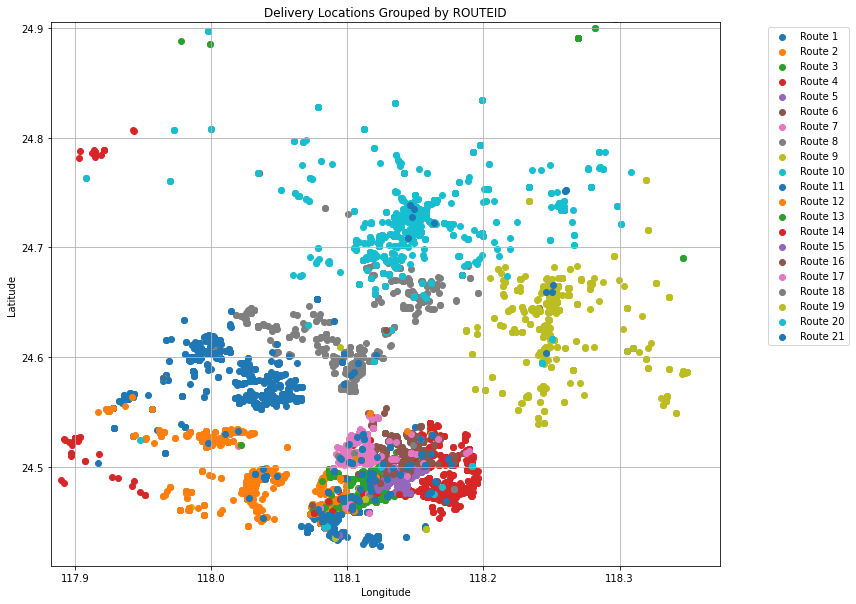

In [22]:
# 1. Load the data
data = df_xiamen
# 2. Extract and process the 'location' data (if not already done)
if 'longitude' not in data.columns or 'latitude' not in data.columns:
    data['longitude'] = data['location'].apply(lambda x: float(x.split(',')[0]))
    data['latitude'] = data['location'].apply(lambda x: float(x.split(',')[1]))

# 3. Group by 'ROUTEID'
grouped = data.groupby('ROUTEID')

# 4. Plot each group
plt.figure(figsize=(12, 10))

for name, group in grouped:
    plt.scatter(group['longitude'], group['latitude'], label=f"Route {name}")

# Set the domain and range
plt.xlim(117.882223, 118.373857)
plt.ylim(24.41, 24.905)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Delivery Locations Grouped by ROUTEID')
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1))
plt.grid(True)
plt.show()

In [33]:
# 1. Load the data
data = df_xiamen

# 2. Extract and process the 'location' data (if not already done)
if 'longitude' not in data.columns or 'latitude' not in data.columns:
    data['longitude'] = data['location'].apply(lambda x: float(x.split(',')[0]))
    data['latitude'] = data['location'].apply(lambda x: float(x.split(',')[1]))

# Filter the data based on longitude and latitude limits
filtered_data = data[
    (data['longitude'] >= 117.882223) & (data['longitude'] <= 118.373857) & 
    (data['latitude'] >= 24.41) & (data['latitude'] <= 24.905)
]
filtered_data = filtered_data.drop(columns=['longitude', 'latitude'])
filtered_data_new = pd.read_csv("Xiamen_locations最新.csv")
filtered_data_new['Index'] = range(len(filtered_data_new))
filtered_data_new
# Save the filtered data to a CSV file
filtered_data_new.to_csv('Xiamen_locations最新.csv', index=False)
filtered_data.to_csv('Xiamen_locations最新没仓库.csv', index=False)

/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_74831/3445867356.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()  # Adjust layout to ensure legend doesn't cut off


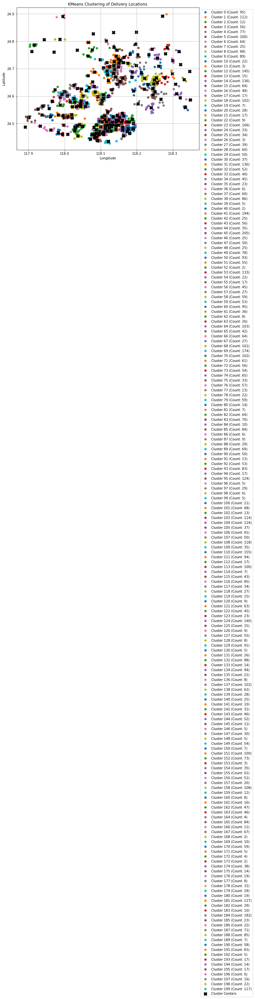

In [40]:
# 1. Load the data
data = filtered_data

# 2. Extract and process the 'location' data
data['longitude'] = data['location'].apply(lambda x: float(x.split(',')[0]))
data['latitude'] = data['location'].apply(lambda x: float(x.split(',')[1]))
location_data = data[['longitude', 'latitude']]

# 3. Use k-means clustering to find 12 clusters
kmeans = KMeans(n_clusters=200).fit(location_data)
data['cluster'] = kmeans.labels_

# 4. Plot the data with each cluster color-coded
plt.figure(figsize=(10, 8))

for cluster_num in range(200):
    subset = data[data['cluster'] == cluster_num]
    count = len(subset)
    plt.scatter(subset['longitude'], subset['latitude'], label=f"Cluster {cluster_num} (Count: {count})")

# Mark cluster centers
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=100, c='black', marker='X', label="Cluster Centers")

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('KMeans Clustering of Delivery Locations')
plt.legend(loc='upper left', bbox_to_anchor=(1,1))  # Adjust legend location to avoid overlapping with the plot
plt.grid(True)
plt.tight_layout()  # Adjust layout to ensure legend doesn't cut off
plt.show()

In [53]:
df_xiamen = pd.read_csv("XiaMen最新送货点详细信息.csv")
df_xiamen['Index'] = range(len(df_xiamen))
df_xiamen.to_csv('XiaMen最新送货点详细信息.csv', index=False)

In [5]:
merged_df = df1.merge(df2[['TransID', 'Xiamen.经度', 'Xiamen.纬度']], left_on='TRANSID', right_on='TransID', how='left')
# Dropping the duplicate "TransID" column from df2 after the merge
merged_df.drop(columns=['TransID'], inplace=True)

In [6]:
merged_df.shape[0]

35973

In [7]:
merged_df = merged_df.dropna(subset=['Xiamen.经度'])

In [8]:
outxiamen_df = merged_df[merged_df['Xiamen.经度'].isna()]
outxiamen_df.to_csv('OutsideXiamen_route_address.csv', index=False)

In [9]:
merged_df.shape[0]

9708

In [10]:
merged_df.to_csv('Xiamen_route_address.csv', index=False)

/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_14294/2200752189.py:20: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_14294/2200752189.py:20: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_14294/2200752189.py:20: UserWarning: Glyph 32428 (\N{CJK UNIFIED IDEOGRAPH-7EAC}) missing from current font.
  plt.tight_layout()
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  fig.canvas.print_figure(bytes_io,

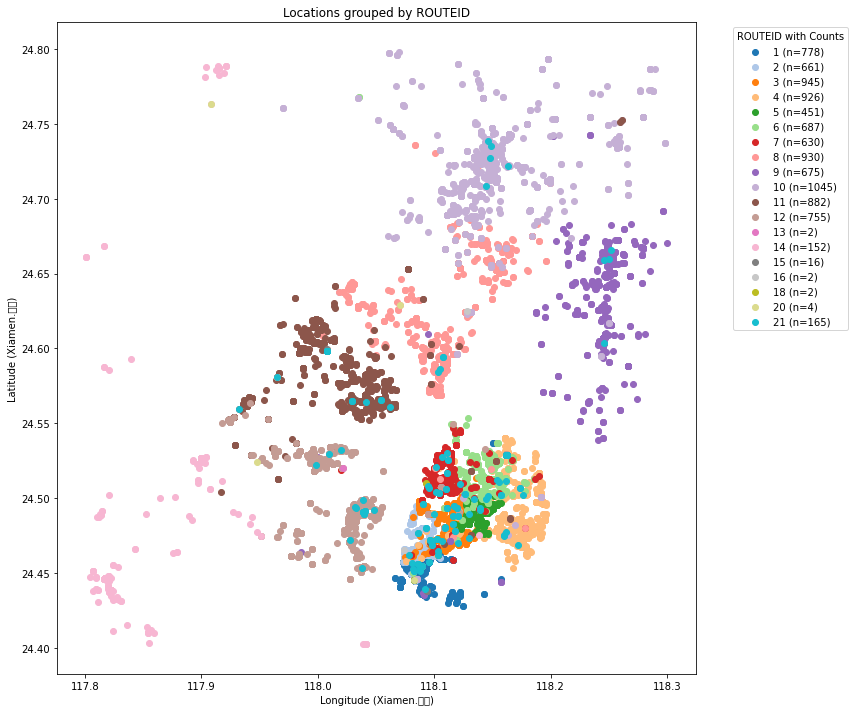

In [11]:
# Get the "tab20" color palette and append a custom color for the 21st route
colors = plt.cm.tab20.colors
colors = list(colors)
colors.append((0.5, 0.1, 0.7, 1.0))  # Adding a custom color for 21st route

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 10))

# Iterate over unique ROUTEID values and plot each group using distinct colors
for index, (routeid, group) in enumerate(merged_df.groupby('ROUTEID')):
    label = f"{routeid} (n={group.shape[0]})"
    ax.scatter(group['Xiamen.经度'], group['Xiamen.纬度'], label=label, color=colors[index % 21])

# Add labels, legend, and display the plot
ax.set_xlabel('Longitude (Xiamen.经度)')
ax.set_ylabel('Latitude (Xiamen.纬度)')
ax.set_title('Locations grouped by ROUTEID')
ax.legend(title='ROUTEID with Counts', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [12]:
m = folium.Map(location=[merged_df['Xiamen.纬度'].mean(), merged_df['Xiamen.经度'].mean()], zoom_start=13)

colors = plt.cm.tab20.colors
colors = list(colors) + [(0.5, 0.1, 0.7, 1.0)]

# Iterate over unique ROUTEID values and plot each group using distinct colors
for index, (routeid, group) in enumerate(merged_df.groupby('ROUTEID')):
    color = "#{:02x}{:02x}{:02x}".format(int(colors[index % 21][0]*255), int(colors[index % 21][1]*255), int(colors[index % 21][2]*255))
    for _, row in group.iterrows():
        folium.CircleMarker(
            location=(row['Xiamen.纬度'], row['Xiamen.经度']),
            radius=5,
            color=color,
            fill=True,
            fill_opacity=0.6,
            tooltip=str(routeid)
        ).add_to(m)

# Display the map
m

/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/1584897767.py:28: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/1584897767.py:28: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/1584897767.py:28: UserWarning: Glyph 32428 (\N{CJK UNIFIED IDEOGRAPH-7EAC}) missing from current font.
  plt.tight_layout()
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **

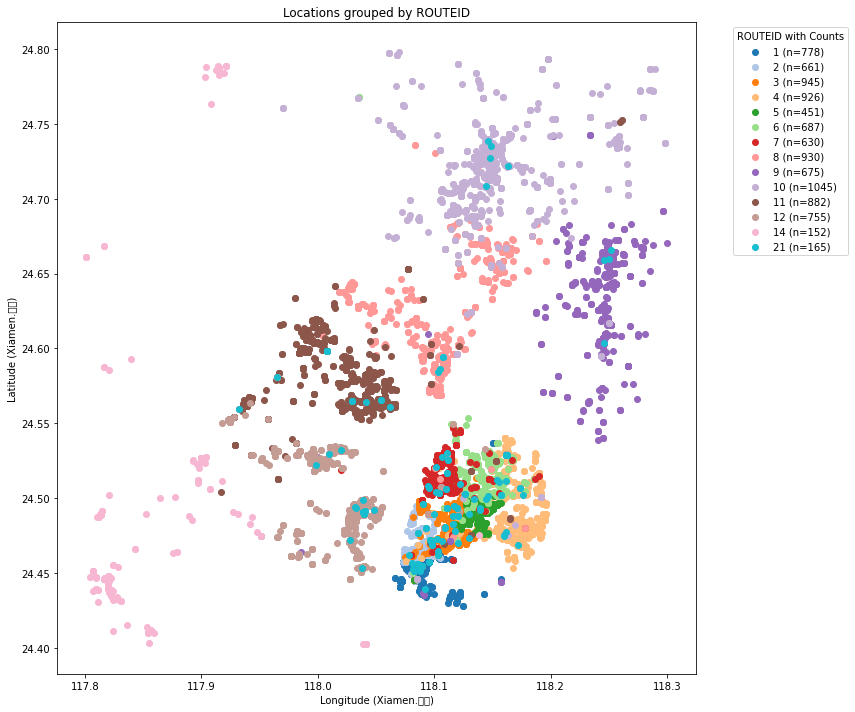

In [2]:
merged_df = pd.read_csv("Xiamen_route_address.csv")
# Get the "tab20" color palette and append a custom color for the 21st route
colors = plt.cm.tab20.colors
colors = list(colors)
colors.append((0.5, 0.1, 0.7, 1.0))  # Adding a custom color for 21st route

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 10))

# List of ROUTEID values you don't want to show
exclude_routes = [13, 15, 16, 18, 20]

# Iterate over unique ROUTEID values and plot each group using distinct colors
for index, (routeid, group) in enumerate(merged_df.groupby('ROUTEID')):
    # If the current ROUTEID is in the exclude list, skip the plotting for this group
    if routeid in exclude_routes:
        continue

    label = f"{routeid} (n={group.shape[0]})"
    ax.scatter(group['Xiamen.经度'], group['Xiamen.纬度'], label=label, color=colors[index % 21])

# Add labels, legend, and display the plot
ax.set_xlabel('Longitude (Xiamen.经度)')
ax.set_ylabel('Latitude (Xiamen.纬度)')
ax.set_title('Locations grouped by ROUTEID')
ax.legend(title='ROUTEID with Counts', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/718606934.py:27: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/718606934.py:27: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/718606934.py:27: UserWarning: Glyph 32428 (\N{CJK UNIFIED IDEOGRAPH-7EAC}) missing from current font.
  plt.tight_layout()
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)

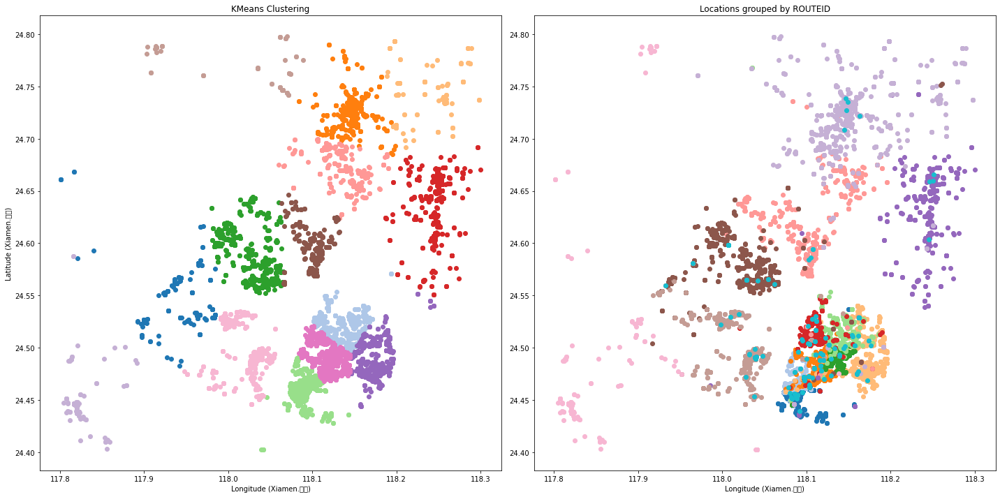

In [13]:
# Visual Comparison

# KMeans clustering
kmeans = KMeans(n_clusters=14, random_state=42)
merged_df['Cluster'] = kmeans.fit_predict(merged_df[['Xiamen.经度', 'Xiamen.纬度']])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Plotting KMeans clustering result
for cluster in range(21):
    subset = merged_df[merged_df['Cluster'] == cluster]
    ax1.scatter(subset['Xiamen.经度'], subset['Xiamen.纬度'], label=f"Cluster {cluster}", color=colors[cluster])
ax1.set_title("KMeans Clustering")
ax1.set_xlabel('Longitude (Xiamen.经度)')
ax1.set_ylabel('Latitude (Xiamen.纬度)')

# Plotting ROUTEID grouping result (from your previous code)
exclude_routes = [13, 15, 16, 18, 20]
for index, (routeid, group) in enumerate(merged_df.groupby('ROUTEID')):
    if routeid in exclude_routes:
        continue
    label = f"{routeid} (n={group.shape[0]})"
    ax2.scatter(group['Xiamen.经度'], group['Xiamen.纬度'], label=label, color=colors[index % 21])
ax2.set_title("Locations grouped by ROUTEID")
ax2.set_xlabel('Longitude (Xiamen.经度)')

plt.tight_layout()
plt.show()

In [8]:
# Quantitative Comparison
# Get the clustering labels from KMeans and the ROUTEID labels (excluding specific ROUTEIDs)
cluster_labels = merged_df['Cluster'].values
routeid_labels = merged_df['ROUTEID'].values
coordinates = merged_df[['Xiamen.经度', 'Xiamen.纬度']].values

# Compute scores
cluster_silhouette = silhouette_score(coordinates, cluster_labels)
routeid_silhouette = silhouette_score(coordinates, routeid_labels)

cluster_davies_bouldin = davies_bouldin_score(coordinates, cluster_labels)
routeid_davies_bouldin = davies_bouldin_score(coordinates, routeid_labels)

print(f"Silhouette Score: Clustering: {cluster_silhouette}, ROUTEID: {routeid_silhouette}")
print(f"Davies-Bouldin Score: Clustering: {cluster_davies_bouldin}, ROUTEID: {routeid_davies_bouldin}")

Silhouette Score: Clustering: 0.4892127377819786, ROUTEID: 0.16965309723695762
Davies-Bouldin Score: Clustering: 0.6564421113579121, ROUTEID: 4.196146486153469


#### The real routes graph shows many intersections, which may decrease delivery efficiency. But the real word issue is different from the theoretical analysis. I am consider to unify these two strategies.

/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/3886812058.py:52: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/3886812058.py:52: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  plt.tight_layout()
/var/folders/3m/d1t5bhcx41n2gcv2znb8f6c40000gn/T/ipykernel_9844/3886812058.py:52: UserWarning: Glyph 32428 (\N{CJK UNIFIED IDEOGRAPH-7EAC}) missing from current font.
  plt.tight_layout()
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 32463 (\N{CJK UNIFIED IDEOGRAPH-7ECF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/zhanghaiyue/opt/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from current font.
  fig.canvas.print_figure(bytes_io, **

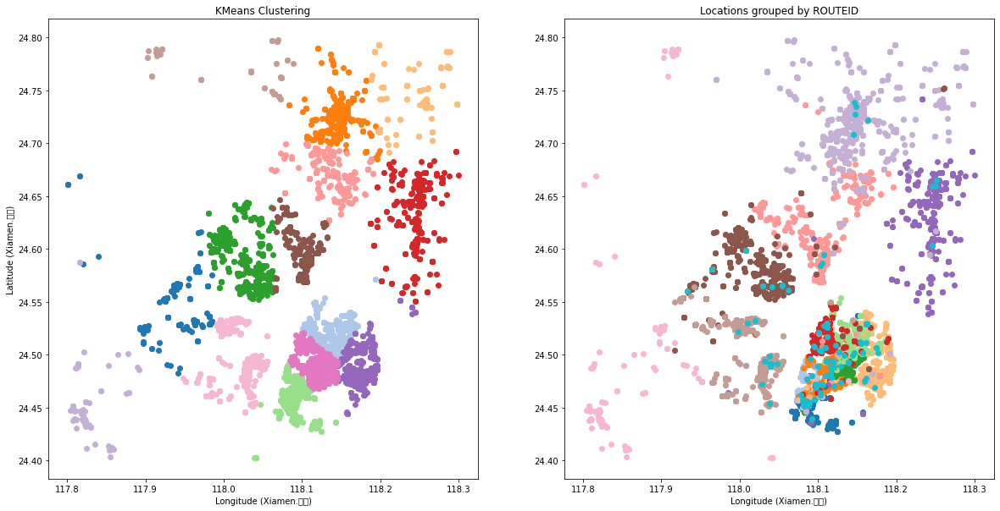

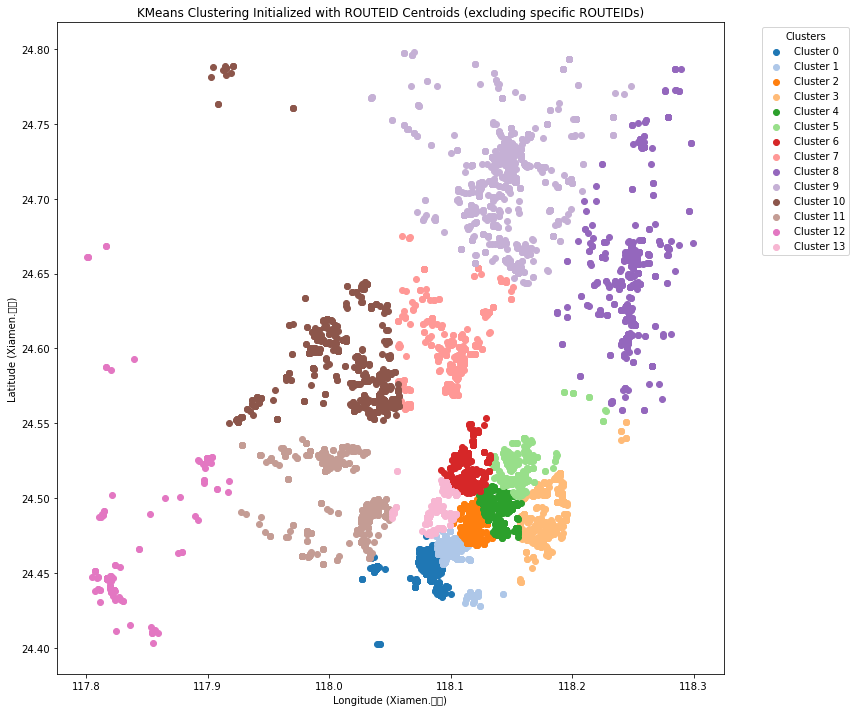

In [14]:
# Visual Comparison

# KMeans clustering
kmeans = KMeans(n_clusters=14, random_state=42)
merged_df['Cluster'] = kmeans.fit_predict(merged_df[['Xiamen.经度', 'Xiamen.纬度']])

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# Plotting KMeans clustering result
for cluster in range(21):
    subset = merged_df[merged_df['Cluster'] == cluster]
    ax1.scatter(subset['Xiamen.经度'], subset['Xiamen.纬度'], label=f"Cluster {cluster}", color=colors[cluster])
ax1.set_title("KMeans Clustering")
ax1.set_xlabel('Longitude (Xiamen.经度)')
ax1.set_ylabel('Latitude (Xiamen.纬度)')

# Plotting ROUTEID grouping result (from your previous code)
exclude_routes = [13, 15, 16, 18, 20]
for index, (routeid, group) in enumerate(merged_df.groupby('ROUTEID')):
    if routeid in exclude_routes:
        continue
    label = f"{routeid} (n={group.shape[0]})"
    ax2.scatter(group['Xiamen.经度'], group['Xiamen.纬度'], label=label, color=colors[index % 21])
ax2.set_title("Locations grouped by ROUTEID")
ax2.set_xlabel('Longitude (Xiamen.经度)')

# Unifying these two graphs together
# 0. List of ROUTEID values to exclude
exclude_routes = [13, 15, 16, 18, 20]
# 1. Determine unique centroids based on ROUTEID labeling, excluding the specified ROUTEIDs
filtered_df = merged_df[~merged_df['ROUTEID'].isin(exclude_routes)]
centroids = filtered_df.groupby('ROUTEID').mean()[['Xiamen.经度', 'Xiamen.纬度']].values

# 2. Initialize KMeans using these centroids
kmeans = KMeans(n_clusters=len(centroids), init=centroids, n_init=1, random_state=42)

# 3. Perform clustering using KMeans
merged_df['Cluster'] = kmeans.fit_predict(merged_df[['Xiamen.经度', 'Xiamen.纬度']])

# Visualization
fig, ax = plt.subplots(figsize=(12, 10))

# Using the same colors array from previous code snippets
for cluster in range(len(centroids)):
    subset = merged_df[merged_df['Cluster'] == cluster]
    ax.scatter(subset['Xiamen.经度'], subset['Xiamen.纬度'], label=f"Cluster {cluster}", color=colors[cluster % len(colors)])

ax.set_title("KMeans Clustering Initialized with ROUTEID Centroids (excluding specific ROUTEIDs)")
ax.set_xlabel('Longitude (Xiamen.经度)')
ax.set_ylabel('Latitude (Xiamen.纬度)')
ax.legend(title="Clusters", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [10]:
merged_df['ROUTEID'].nunique()

19